# Inanimate
by Ryan Murdoch
https://github.com/rynmurdock/inanimate

Colab by Chigozie Nri 2023-07-26

Uses [AnimateDiff](https://arxiv.org/abs/2307.04725) to start with an initial image for an animation's first frame

## Examples

<img src="https://cdn.discordapp.com/attachments/1133889357611282502/1133893285379854346/chigozie_rocket.gif" height="300px" />
<img src="https://cdn.discordapp.com/attachments/1133889357611282502/1133889619981783160/advadnoun_origami.gif" height="300px" />
<img src="https://cdn.discordapp.com/attachments/1133889357611282502/1133889620451541103/advadnoun_peck.gif" height="300px" />


<img src="https://cdn.discordapp.com/attachments/1133889357611282502/1133891066723045566/advadnoun_mona.gif" height="300px" />
<img src="https://cdn.discordapp.com/attachments/1133889357611282502/1133891850957242488/advadnoun_dog.gif" height="300px" />
<img src="https://cdn.discordapp.com/attachments/1133889357611282502/1133907319583932486/chigozie_coffee.gif" height="300px" />

In [ ]:
%%capture
# @title Clone repo and install libraries
!git clone https://github.com/rynmurdock/inanimate.git
!pip install einops
!pip install xformers
!pip install omegaconf
!pip install 'diffusers[torch]==0.11.1' torchvision
!pip install transformers
!pip install accelerate
!pip install huggingface_hub

In [ ]:
# @title Get models
# @markdown This might take a while
from huggingface_hub import snapshot_download, hf_hub_download
# @markdown Use SD 1.4? (N.B. 1.4 tends to give more dramatic motion. You must be logged in to your hugging face account to download 1.4 - follow the prompts and enter your token)
use_1_4 = True #@param {type:"boolean"}

# @markdown Use SD 1.5?
use_1_5 = False #@param {type:"boolean"}

if use_1_4:
    hf_hub_download(repo_id='guoyww/animatediff', filename='mm_sd_v14.ckpt', local_dir='inanimate/models/Motion_Module')
    snapshot_download(repo_id='CompVis/stable-diffusion-v1-4', revision='main', local_dir='inanimate/models/StableDiffusion/sd-1.4')
if use_1_5:
    snapshot_download(repo_id='runwayml/stable-diffusion-v1-5', revision='main', local_dir='inanimate/models/StableDiffusion/sd-1.5')
    hf_hub_download(repo_id='guoyww/animatediff', filename='mm_sd_v15.ckpt', local_dir='inanimate/models/Motion_Module')


In [ ]:
%%capture
# @title Get example image
# @markdown Uncheck this if you will use your own image
use_example_image = True #@param {type:"boolean"}
if use_example_image:
    !conda install scikit-image
    import skimage.data
    import skimage.io
    skimage.io.imsave('coffee.png', skimage.data.coffee())

In [ ]:
# @title Change parameters
# @markdown Change to your downloaded SD directory
model_path = "/content/inanimate/models/StableDiffusion/sd-1.4" #@param {type:"string"}

# @markdown Change to your downloaded motion module checkpoint
motion_module = "./models/Motion_Module/mm_sd_v14.ckpt" #@param {type:"string"}

# @markdown Change to your uploaded image path
image_path = "/content/coffee.png" #@param {type:"string"}

prompt = "steaming coffee cup" #@param {type:"string"}

negative_prompt = "flickering, confusing -- weird edits and cuts" #@param {type:"string"}

image_strength = 0.2 #@param {type:"number"}

n_frames = 16 #@param {type:"number"}

steps = 16 #@param {type:"number"}

guidance_scale = 20 #@param {type:"number"}

yaml = f"""
Uncond:
  base: ""
  path: ""
  motion_module:
    - "{motion_module}"

  seed:           -1
  steps:          {steps}
  guidance_scale: {guidance_scale}

  prompt:
    - ""

  n_prompt:
    - {negative_prompt}
"""

with open('/content/inanimate/configs/prompts/uncond.yaml', 'w') as f:
    f.write(yaml)


In [ ]:
# # If you get an error in the cell below complaining about the fps argument, try uncommenting this and running first
# !find /content/inanimate/animatediff/utils/util.py -type f -exec sed -i 's/fps=fps/duration=1000 * 1\/fps/g' {} \;

In [ ]:
# # If you are out of memory, try uncommenting this cell and running
# import torch
# torch.cuda.empty_cache()
# !nvidia-smi

In [ ]:
# @title Run Inanimate
%cd /content/inanimate
!python -m scripts.animate --config ./configs/prompts/uncond.yaml --pretrained_model_path $model_path \
    --start_image "$image_path" \
    --prompt "$prompt" \
    --init_strength $image_strength \
    --L $n_frames
%cd /content

/content/inanimate
2023-07-26 23:34:43.445285: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
The config attributes {'scaling_factor': 0.18215} were passed to AutoencoderKL, but are not expected and will be ignored. Please verify your config.json configuration file.
loaded temporal unet's pretrained weights from /content/inanimate/models/StableDiffusion/sd-1.4/unet ...
### missing keys: 560; 
### unexpected keys: 0;
### Temporal Module Parameters: 417.1376 M
['']
current seed: 13224810533246185711
sampling steaming coffee cup ...
100% 13/13 [02:13<00:00, 10.24s/it]
100% 16/16 [00:06<00:00,  2.39it/s]
save to samples/uncond-2023-07-26T23-34-48/sample/steaming-coffee-cup.gif
/content


/content/inanimate/samples/uncond-2023-07-26T23-20-29/sample.gif


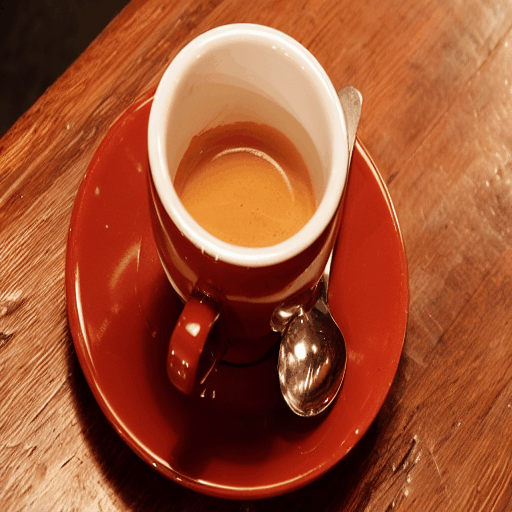

/content/inanimate/samples/uncond-2023-07-26T23-28-59/sample.gif


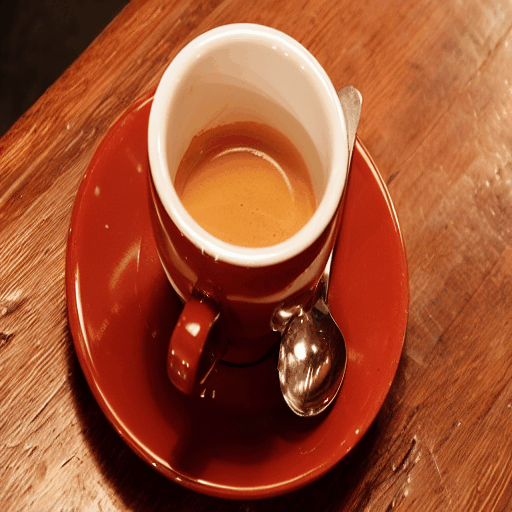

/content/inanimate/samples/uncond-2023-07-26T23-34-48/sample.gif


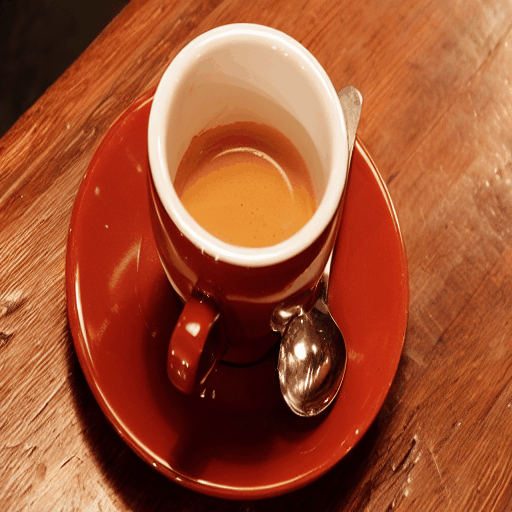

In [ ]:
# @title Display results
# @markdown Note that this displays every result so far (if you haven't moved the files)
import os
from IPython.display import Image
parent = '/content/inanimate/samples/'
for dirname in next(os.walk(parent))[1]:
    full_path = os.path.join(parent, dirname, 'sample.gif')
    try:
        im = Image(open(full_path, 'rb').read())
    except FileNotFoundError:
        continue
    else:
        print(full_path)
        display(im)

In [ ]:
# # Delete existing outputs before continuing if you wish
# !rm -r /content/inanimate/samples/uncond*